**Authors**
- Dotti Andrea [[_Github profile_](https://github.com/AndreaD002)][[_Institutional_ _email_](mailto:andrea.dotti4@studio.unibo.it)]
    * Student ID: 0001180322
- Petrelli Tommaso [[_Github profile_](https://github.com/petrello)][[_Institutional_ _email_](mailto:tommaso.petrelli2@studio.unibo.it)]
    * Student ID: 0001179757

# **Product Recognition of Books**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it

Computer vision-based object detection techniques can be applied in library or bookstore settings to build a system that identifies books on shelves.

Such a system could assist in:
* Helping visually impaired users locate books by title/author;
* Automating inventory management (e.g., detecting misplaced or out-of-stock books);
* Enabling faster book retrieval by recognizing spine text or cover designs.

## Task
Develop a computer vision system that, given a reference image for each book, is able to identify such book from one picture of a shelf.

<figure>
<a href="https://ibb.co/pvLVjbM5"><img src="https://i.ibb.co/svVx9bNz/example.png" alt="example" border="0"></a>
</figure>

For each type of product displayed on the shelf, the system should compute a bounding box aligned with the book spine or cover and report:
1. Number of instances;
1. Dimension of each instance (area in pixel of the bounding box that encloses each one of them);
1. Position in the image reference system of each instance (four corners of the bounding box that enclose them);
1. Overlay of the bounding boxes on the scene images.

<font color="red"><b>Each step of this assignment must be solved using traditional computer vision techniques.</b></font>

#### Example of expected output
```
Book 0 - 2 instance(s) found:
  Instance 1 {top_left: (100,200), top_right: (110, 220), bottom_left: (10, 202), bottom_right: (10, 208), area: 230px}
  Instance 2 {top_left: (90,310), top_right: (95, 340), bottom_left: (24, 205), bottom_right: (23, 234), area: 205px}
Book 1 – 1 instance(s) found:
.
.
.
```

## Import Python Libraries

In [1]:
import os
import cv2
import glob
import numpy as np

from matplotlib import pyplot as plt
from typing import List, Tuple, Optional
from pydantic import BaseModel, Field, model_serializer

import warnings
warnings.simplefilter("ignore")

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify;
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios.

In [2]:
## UNCOMMENT IF YOU'RE IN GOOGLE COLAB ENVIRONMENT!

# from google.colab import drive
# drive.mount('/content/drive')

# # Load and unzip the dataset
# !cp -r /content/drive/MyDrive/AssignmentsIPCV/dataset.zip ./
# !unzip dataset.zip

In [3]:
# Define utils functions
def load_images_from_folder(folder_path, pre_pattern, post_pattern):
    len_imgs = len(glob.glob(os.path.join(folder_path, f"*{post_pattern}")))
    images = []
    for i in range(len_imgs):
        path = folder_path + '/' + pre_pattern + str(i) + post_pattern
        img = cv2.imread(path, cv2.IMREAD_COLOR_RGB)
        if img is not None:
            images.append((img, os.path.basename(path)))
    return images

def plot_image_grid(images, title, max_cols=6, img_size=(2, 2)):
    n_images = len(images)
    cols = min(n_images, max_cols)
    rows = (n_images + cols - 1) // cols

    plt.figure(figsize=(img_size[0]*cols, img_size[1]*rows))
    for idx, (img, name) in enumerate(images):
        plt.subplot(rows, cols, idx + 1)
        plt.imshow(img)
        plt.title(name + '\n' + str(img.shape), fontsize=8)
        plt.axis('off')
    plt.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

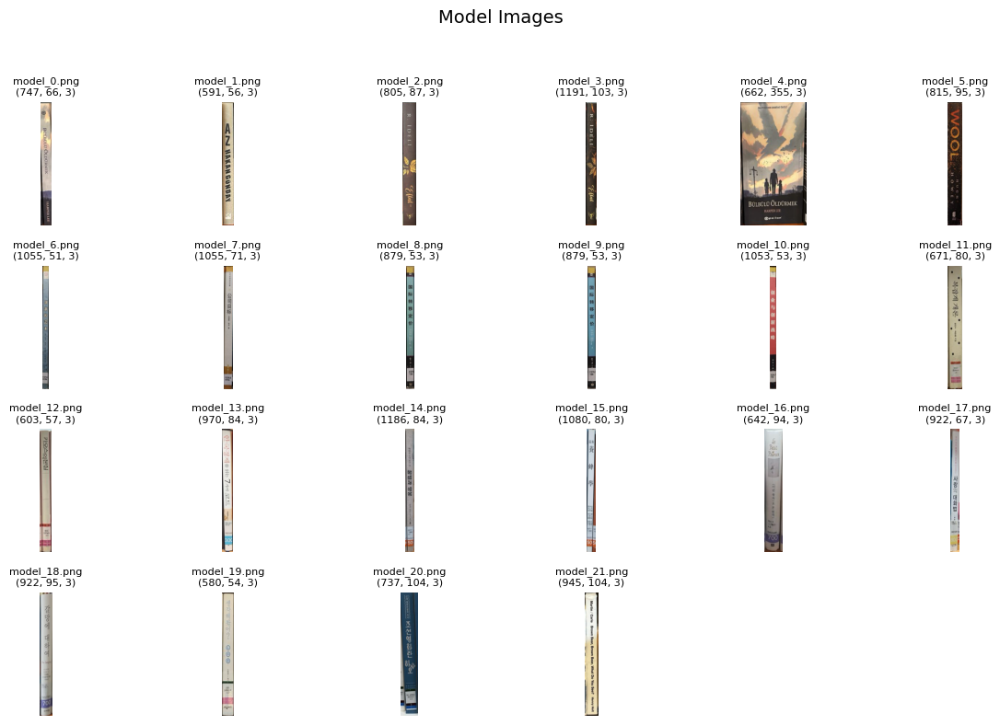

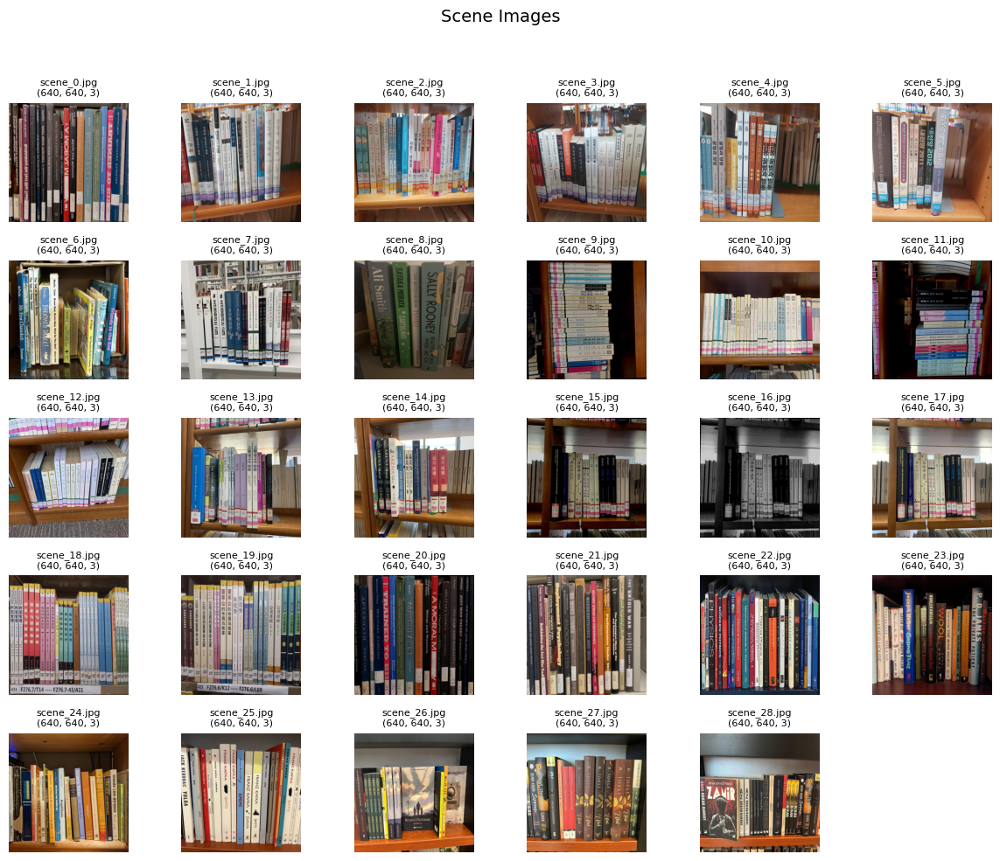

In [4]:
# Define dataset paths
MODELS_PATH = os.path.join('dataset', 'models')
SCENES_PATH = os.path.join('dataset', 'scenes')

# Load and plot model images
model_images = load_images_from_folder(MODELS_PATH, "model_", ".png")
plot_image_grid(model_images, "Model Images", max_cols=6, img_size=(2, 2))

# Load and plot scene images
scene_images = load_images_from_folder(SCENES_PATH, "scene_", ".jpg")
plot_image_grid(scene_images, "Scene Images", max_cols=6, img_size=(2, 2))

## Evaluation criteria
1. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

2. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed and justified approach that solves more or all instances.

---

# **Proposed solution: multiple books detection system based on scale-invariant features matching**

In this project, we design and implement a complete traditional Computer Vision pipeline capable of detecting multiple instances of books on a shelf starting from their corresponding reference model images. The objective is to identify, for each book model, all occurrences in a scene image represented by bounding boxes identified by corners' coordinates and area.

Our approach is entirely based on local invariant features and geometric verification. The core idea is that each book cover or spine contains unique visual patterns that produce distinctive keypoints. By detecting and matching these keypoints across model and scene images, we can establish robust correspondences and estimate the geometric transformation that maps the model onto the scene.

### Utility models

To ensure that detection results are stored and handled in a structured and readable way, we introduce two auxiliary classes:

- **`BookInstance`**  
  Represents a single detection of a book in the scene. The class stores:
  - `instance_idx`: incremental identifier of this particular instance.
  - `top_left`, `top_right`, `bottom_left`, `bottom_right`: the four corners of the detected bounding box.
  - `area`: area in pixels of the quadrilateral.

- **`DetectionResult`**  
  Collects all detections related to a single model image. It stores:
  - `book_idx`: the index of the book model.
  - `image`: the model image.
  - `instances`: the list of `BookInstance` detected.

In [5]:
class BookInstance(BaseModel):
    """
    Represents a single detected instance of a book with corner coordinates and computed area.
    """
    instance_idx: int = Field(..., description="Unique index of this book instance")
    top_left: Tuple[int, int] = Field(..., description="Top-left corner coordinates (x, y)")
    top_right: Tuple[int, int] = Field(..., description="Top-right corner coordinates (x, y)")
    bottom_left: Tuple[int, int] = Field(..., description="Bottom-left corner coordinates (x, y)")
    bottom_right: Tuple[int, int] = Field(..., description="Bottom-right corner coordinates (x, y)")
    area: int = Field(..., description="Calculated area in pixels")

    def __str__(self) -> str:
        """Readable string representation of a book instance."""
        return (
            f"Instance {self.instance_idx} "
            f"{{top_left: {self.top_left}, top_right: {self.top_right}, "
            f"bottom_left: {self.bottom_left}, bottom_right: {self.bottom_right}, "
            f"area: {self.area}px}}"
        )

class DetectionResult(BaseModel):
    """
    Represents the detection results for a specific book index,
    containing all detected instances of that book.
    """
    book_idx: int = Field(..., description="Index of the detected book type")
    image: np.ndarray = Field(..., description="Image of the detected book.")
    instances: List[BookInstance] = Field(default_factory=list, description="List of detected book instances")

    class Config:
        arbitrary_types_allowed = True

    @model_serializer(mode="plain")
    def serialize_model(self) -> str:
        """Custom serializer that produces a readable text summary of detections."""
        header = f"Book {self.book_idx} - {len(self.instances)} instance(s) found"
        instance_strs = "\n".join(f"\t{instance}" for instance in self.instances)
        return f"{header}:\n{instance_strs}" if self.instances else header

### Utility methods

The method `adjust_corners_to_rectangle` refines the raw detected box produced by the homography estimation. Homographies obtained from feature matches often introduce slight geometric inconsistencies when the matched keypoints are not perfectly distributed across the model.

To mitigate these artifacts, this helper function takes the four projected corners and regularizes them into a rectangular shape.


In [6]:
def adjust_corners_to_rectangle( 
    corners: List[Tuple[float, float]]
) -> Tuple[List[Tuple[float, float]], float, float, float]:
    """
    Adjust detected corners to form a proper rectangle with parallel opposite edges.
    
    Uses the minimum area bounding rectangle algorithm to find the best-fit
    rectangle for the detected quadrilateral. This is rotation-invariant and
    works for books at any angle.
    
    Args:
        corners: List of 4 corners [top_left, bottom_left, bottom_right, top_right].
        
    Returns:
        Tuple of (adjusted_corners, long_dimension).
    """
    # Find the minimum area bounding rectangle
    rect = cv2.minAreaRect(np.array(corners, dtype=np.float32))
    _, (width, height), _ = rect
    
    # Determine long dimension (rotation-invariant)
    long_dim = max(width, height)
    
    # Get the four corners of the fitted rectangle
    box = cv2.boxPoints(rect)
    box = np.array(box, dtype=np.float32)
    
    # Order the corners consistently: [top_left, bottom_left, bottom_right, top_right]
    # Sort by y-coordinate to separate top and bottom pairs
    sorted_by_y = box[np.argsort(box[:, 1])]
    top_pair = sorted_by_y[:2]
    bottom_pair = sorted_by_y[2:]
    
    # Within each pair, sort by x-coordinate (left to right)
    top_left, top_right = top_pair[np.argsort(top_pair[:, 0])]
    bottom_left, bottom_right = bottom_pair[np.argsort(bottom_pair[:, 0])]
    
    adjusted_corners = [
        tuple(top_left),
        tuple(bottom_left),
        tuple(bottom_right),
        tuple(top_right)
    ]
    
    return adjusted_corners, long_dim

The function `visualize_scene_with_models` provides a visual representation of the detection results. Given a scene image and the list of detected bounding boxes, it overlays all book detections on top of the original scene.

In [7]:
def visualize_scene_with_models(
    scene: Tuple[np.ndarray, str],
    detections: List[DetectionResult],
    figsize: Tuple[int, int] = (16, 6),
) -> None:
    """
    Visualize detected models and the scene image with bounding boxes.

    Args:
        scene: Tuple of (scene_image, scene_name).
        detections: List of DetectionResult objects.
        figsize: Size of the matplotlib figure.
    """
    img_scene, scene_name = scene
    scene_idx = int(scene_name.replace("scene_", "").replace(".jpg", ""))

    colors = plt.cm.Set1.colors
    scene_vis = img_scene.copy()

    # Draw detections on the scene image
    for i, det in enumerate(detections):
        color = tuple(int(c * 255) for c in colors[i % len(colors)])
        for instance in det.instances:
            pts = np.array(
                [
                    instance.top_left,
                    instance.bottom_left,
                    instance.bottom_right,
                    instance.top_right,
                ],
                np.int32,
            ).reshape((-1, 1, 2))
            cv2.polylines(scene_vis, [pts], True, color, 3)

    # Prepare preview images for each model
    previews, titles = [], []
    for i, det in enumerate(detections):
        color = tuple(int(c * 255) for c in colors[i % len(colors)])
        h, w = det.image.shape[:2]
        cv2.rectangle(det.image, (2, 2), (w - 2, h - 2), color, 10)
        previews.append(det.image)
        titles.append(f"Book {det.book_idx}")

    # Append the annotated scene
    previews.append(scene_vis)
    titles.append(f"Scene {scene_idx}")

    # Plot results
    _, axes = plt.subplots(1, len(previews), figsize=figsize)
    if len(previews) == 1:
        axes = [axes]

    for ax, img, title in zip(axes, previews, titles):
        ax.imshow(img)
        ax.set_title(title, fontsize=12)
        ax.axis("off")

    plt.tight_layout()
    plt.show()

## Detection pipeline

The core of our project is the `MultiInstanceBookDetector` class, whose `detect_multiple_instances` method implements a multi-stage pipeline for locating multiple occurrences of a book model within a scene. The method integrates dense SIFT extraction, brute-force descriptor matching, homography-based geometric verification, and iterative region masking to progressively uncover all valid instances of the model.


### Parameterization and design rationale

The detector exposes several configuration parameters that were empirically tuned for this dataset.
SIFT descriptors are computed using a finely adjusted configuration, and matching is performed via L2 brute-force matching that guarantees exact nearest-neighbor retrieval. 

Core parameters include:
- `lowe_ratio`: controls Lowe’s ratio test used to filter ambiguous K-Nearest Neighbors correspondences.
- `min_match_count`: is the minimum number of valid matches surviving the Lowe filter required to attempt geometric verification.
- `ransac_reproj_threshold` and `min_inlier_ratio`: govern the robustness of the estimated homography through `USAC_MAGSAC`, ensuring that only geometrically coherent matches drive detections.
- `min_length_ratio`, `max_length_ratio` and `max_area_ratio`: geometric safeguards that constrain the shape and scale of detected boxes, preventing acceptance of partial, or degenerate detections.


### Multi-iteration detection procedure

Detection proceeds through a structured iterative scheme in which, at each iteration, one candidate instance is extracted, validated, masked, and then removed from subsequent analysis.

#### 1. Descriptor matching
Model and scene descriptors are matched via a deteministic KNN (`k = 2`) brute-force approach, followed by Lowe's ratio test to form the set of reliable correspondences. These good matches serve as the input for homography estimation.

#### 2. Homography estimation
If the number of good matches exceeds `min_match_count`, a projective transformation is estimated using `cv2.findHomography` with the `USAC_MAGSAC` estimator. This variant is more computationally efficient and offers  stronger robustness than classical RANSAC.

#### 3. Projection and rectification of model corners
The four corners of the model image are projected into the scene using the estimated homography. Since noisy match distributions may cause slight non-rectangular distortions, we apply the `adjust_corners_to_rectangle` function to obtain a stable, orientation-consistent rectangle whose geometry is suitable for area calculation and later masking.

#### 4. Geometric validation

Each candidate detection is subjected to stringent validation criteria:
- Area constraint to discard extremely small detections.
- Inlier-ratio constraint to ensure that a significant portion of matches supports a single coherent homography.
- Scale constraints on the detected box’s long side relative to the first accepted instance of the same model, enforcing that the detected region does not degenerate.

Only candidates satisfying all of these checks are accepted.

#### 5. Iterative masking

Upon acceptance, the detected area is converted into a binary mask via `cv2.fillPoly`. Subsequent SIFT computations erase keypoints in this region, preventing re-detection of the same instance.

In [8]:
class MultiInstanceBookDetector:
    """
    Detector for finding multiple instances of a book cover in a scene image.
    
    Uses SIFT features, descriptor matching, and RANSAC-based homography estimation
    to detect book instances. Iteratively masks out detected regions to find multiple
    instances of the same book.
    """
    
    def __init__(
        self,
        sift: cv2.SIFT,
        min_match_count: int,
        matching_method: str,
        lowe_ratio: float,
        ransac_reproj_threshold: float,
        min_inlier_ratio: float,
        min_length_ratio: float,
        max_length_ratio: float,
        max_area_ratio: float,
        verbose: bool
    ) -> None:
        """
        Initialize the multi-instance book detector.

        Args:
            sift: Preconfigured OpenCV SIFT detector.
            min_match_count: Minimum number of good matches required for detection.
            matching_method: 'flann' for FLANN-based matching, 'bf' for brute-force.
            lowe_ratio: Lowe's ratio test threshold for filtering ambiguous matches.
            ransac_reproj_threshold: RANSAC reprojection threshold for homography.
            min_inlier_ratio: Minimum ratio of inliers to total matches.
            min_length_ratio: Minimum ratio of rectangle long dimension vs first detection.
            max_length_ratio: Maximum ratio of rectangle long dimension vs first detection.
            max_area_ratio: Maximum ratio of model's area vs current detection's area.
            verbose: Whether to print detection statistics.
        """
        self.sift = sift
        self.min_match_count = min_match_count
        self.lowe_ratio = lowe_ratio
        self.ransac_reproj_threshold = ransac_reproj_threshold
        self.min_inlier_ratio = min_inlier_ratio
        self.min_length_ratio = min_length_ratio
        self.max_length_ratio = max_length_ratio
        self.max_area_ratio = max_area_ratio
        self.verbose = verbose

        # Initialize feature matcher
        if matching_method == "flann":
            index_params = dict(algorithm=1, trees=5)
            search_params = dict(checks=100)
            self.matcher = cv2.FlannBasedMatcher(index_params, search_params)
        elif matching_method == 'bf':
            self.matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
        else:
            raise ValueError(f"Feature matcher not supported: {matching_method}")

    def _log(self, message: str) -> None:
        """Print message if verbose mode is enabled."""
        if self.verbose:
            print(message)

    def detect_multiple_instances(
        self,
        model_descriptors: Tuple[List[cv2.KeyPoint], np.ndarray],
        scene_descriptors: Tuple[List[cv2.KeyPoint], np.ndarray],
        model: Tuple[np.ndarray, str],
        scene: Tuple[np.ndarray, str],
        max_iterations: int,
        visualize_masks: bool,
    ) -> DetectionResult:
        """
        Detect multiple instances of the model image within the scene.

        Args:
            model_descriptors: Tuple of (keypoints, descriptors) for the model image.
            scene_descriptors: Tuple of (keypoints, descriptors) for the scene image.
            model: Tuple of (model_image, model_name).
            scene: Tuple of (scene_image, scene_name).
            max_iterations: Maximum number of detection iterations.
            visualize_masks: Whether to display masked regions after each iteration.

        Returns:
            DetectionResult containing all detected book instances.
        """
        img_model, model_name = model
        img_scene, _ = scene

        # Store initial long dimension
        init_long_dim = -1

        # Convert images to grayscale if needed
        model_gray = (
            cv2.cvtColor(img_model, cv2.COLOR_RGB2GRAY)
            if len(img_model.shape) == 3
            else img_model.copy()
        )
        scene_gray = (
            cv2.cvtColor(img_scene, cv2.COLOR_RGB2GRAY)
            if len(img_scene.shape) == 3
            else img_scene.copy()
        )

        # Initialize descriptors and mask
        kp_model, des_model = model_descriptors
        mask = np.ones(scene_gray.shape, dtype=np.uint8) * 255

        detected_instances = []
        model_idx = int(model_name.replace("model_", "").replace(".png", ""))

        self._log(f"\n{'='*60}")
        self._log(f"Starting detection for model {model_idx}")
        self._log(f"{'='*60}")

        for iteration in range(max_iterations):
            self._log(f"\n--- Iteration {iteration + 1}/{max_iterations} ---")

            # Use pre-computed scene descriptors without mask in the first
            # iteration, otherwise recompute scene descriptors with mask
            kp_scene, des_scene = (
                scene_descriptors
                if iteration == 0
                else self.sift.detectAndCompute(scene_gray, mask)
            )

            # Feature matching using Lowe's ratio test
            matches = self.matcher.knnMatch(des_model, des_scene, k=2)
            good_matches = [
                m for m, n in matches if m.distance < self.lowe_ratio * n.distance
            ]

            self._log(f"Good matches: {len(good_matches)}")

            # Check if we have enough matches
            if len(good_matches) < self.min_match_count:
                self._log(f"Not enough good matches (< {self.min_match_count}). Stopping.")
                break
            
            # Extract matched keypoint coordinates
            src_pts = np.float32(
                [kp_model[m.queryIdx].pt for m in good_matches]
            ).reshape(-1, 1, 2)
            dst_pts = np.float32(
                [kp_scene[m.trainIdx].pt for m in good_matches]
            ).reshape(-1, 1, 2)

            # Estimate homography using RANSAC
            M, mask_affine = cv2.findHomography(
                src_pts, 
                dst_pts, 
                cv2.USAC_MAGSAC, 
                self.ransac_reproj_threshold
            )

            if M is None or mask_affine is None:
                self._log("Homography estimation failed. Stopping.")
                break

            num_inliers = np.sum(mask_affine)
            inlier_ratio = num_inliers / len(good_matches)
            
            self._log(f"Inliers: {num_inliers}/{len(good_matches)} ({inlier_ratio:.2%})")

            # Transform model corners to scene coordinates
            h, w = model_gray.shape[:2]
            model_corners = np.float32([
                [0, 0], 
                [0, h - 1], 
                [w - 1, h - 1], 
                [w - 1, 0]
            ]).reshape(-1, 1, 2)
            
            transformed_corners = cv2.perspectiveTransform(model_corners, M)
            corners = [tuple(pt[0]) for pt in transformed_corners]

            # Adjust corners to form a proper rectangle
            corners, long_dim = adjust_corners_to_rectangle(corners)
            # Save first long dimension of detected region
            if iteration == 0: init_long_dim = long_dim

            # Update transformed_corners for area calculation and masking
            transformed_corners = np.array([
                [corners[0]],
                [corners[1]],
                [corners[2]],
                [corners[3]]
            ], dtype=np.float32)

            # Compute detection area
            area = cv2.contourArea(transformed_corners.reshape(-1, 2))
            self._log(f"Detected area: {area:.0f} pixels")

            # Check if detected area is too small with respect to original model's area
            if area < (h * w) * self.max_area_ratio:
                self._log(f"Area ratio too low (< {self.max_area_ratio:.0%} of model). Stopping.")
                break
            
            # Check inlier ratio threshold
            if inlier_ratio < self.min_inlier_ratio:
                self._log(f"Inlier ratio too low ({(num_inliers / len(good_matches)):.2%} < {self.min_inlier_ratio:.2%}).")
            
                # Check long dimension consistency
                if long_dim < init_long_dim * self.min_length_ratio:
                    self._log(f"Long dimension too short (< {self.min_length_ratio:.0%} of first). Stopping.")
                    break
                if long_dim > init_long_dim * self.max_length_ratio:
                    self._log(f"Long dimension too long (> {self.max_length_ratio:.0%} of first). Stopping.")
                    break

            # Store detected instance
            detected_instances.append(
                BookInstance(
                    instance_idx=len(detected_instances) + 1,
                    top_left=tuple(map(int, corners[0])),
                    bottom_left=tuple(map(int, corners[1])),
                    bottom_right=tuple(map(int, corners[2])),
                    top_right=tuple(map(int, corners[3])),
                    area=int(area),
                )
            )
            
            self._log(f"Detected instance {len(detected_instances)}")

            # Mask out the detected region for next iteration
            cv2.fillPoly(mask, [transformed_corners.astype(np.int32)], 0)

            # Visualize masked regions if requested
            if visualize_masks:
                scene_with_mask = scene_gray.copy()
                scene_with_mask[mask == 0] = 0
                plt.figure(figsize=(10, 8))
                plt.imshow(scene_with_mask, cmap='gray')
                plt.title(f'Iteration {iteration + 1} - Masked regions')
                plt.axis('off')
                plt.tight_layout()
                plt.show()

        self._log(f"\n{'='*60}")
        self._log(f"Detection complete: {len(detected_instances)} instance(s) found")
        self._log(f"{'='*60}\n")

        return DetectionResult(
            book_idx=model_idx, 
            instances=detected_instances, 
            image=img_model
        )

## Define the SIFT detector

The SIFT (Scale-Invariant Feature Transform) detector is a cornerstone of the pipeline. It extracts keypoints that are invariant to scale, rotation, illumination changes, and moderate affine distortions, making it particularly suitable for matching book covers and spines across scenes in our dataset.

We configure SIFT through `cv2.SIFT_create` with parameters carefully tuned for our dataset:

- `nOctaveLayers = 13`: controls the number of layers in each scale-space octave. We increased it to capture a denser set of multiscale keypoints.
- `contrastThreshold = 0.009`: determines the minimal Difference of Gaussian (DoG) response for a keypoint to be kept. We lowered this threshold to retain more low-contrast keypoints.
- `sigma = 1.4`: defines the initial Gaussian blur. We slightly decreased it to reduce smoothing effect to increase the number of detected keypoints.

This configuration was intentionally selected with the goal of maximizing detection completeness rather than computational efficiency. As shown in the notebook, this configuration was empirically validated to achieve 100% detection across the dataset.

In [9]:
# Define SIFT descriptor with tuned parameters
sift = cv2.SIFT_create(nOctaveLayers=13, sigma=1.4, contrastThreshold=.009)

### Pre-compute SIFT descriptors

We pre-compute the SIFT keypoints and descriptors for all model images once at the beginning of the pipeline. Since the reference book covers never change, this step avoids recomputing expensive SIFT extraction repeatedly and improves overall efficiency.

For scene images, we also pre-compute SIFT descriptors for the first iteration. Although subsequent iterations require recomputing descriptors on the masked scene, having an initial descriptor set available significantly speeds up the first detection step. Moreover, when a book is not present in the scene, no masking occurs, and therefore no descriptor recomputation is needed, making this strategy both efficient and well-suited for scenes without the target object.

In [10]:
# Extract descriptors for model images
models_sift = {}
for img_model, model_name in model_images:
    gray_model = cv2.cvtColor(img_model, cv2.COLOR_RGB2GRAY)
    kp, des = sift.detectAndCompute(gray_model, None)
    models_sift[model_name] = (kp, des)

# Extract descriptors for scene images
scenes_sift = {}
for img_scene, scene_name in scene_images:
    gray_scene = cv2.cvtColor(img_scene, cv2.COLOR_RGB2GRAY)
    kp, des = sift.detectAndCompute(gray_scene, None)
    scenes_sift[scene_name] = (kp, des)

## End-to-end pipeline for multi-instance book detection

We apply the proposed detection framework to all scene images, evaluating every book model independently. Before executing the full loop, we instantiate the detector with a set of parameters that emerged through systematic tuning across the dataset.


### Parameter choices

`min_match_count = 52` &#8594; This threshold is dataset-specific and ensures that the homography is estimated on a sufficiently large set of reliable correspondences. With dense SIFT extraction, first instance detections often yield several hundred of good matches, whereas later iterations see a sharp decrease. The selected value is low enough not to suppress valid later detections, yet high enough to avoid unstable homographies.

`lowe_ratio = 0.7` &#8594; We use the the canonical value recommended by Lowe. This value preserves enough reliable matches for homography estimation while filtering ambiguous or locally inconsistent matches.

`ransac_reproj_threshold = 4.0` &#8594; With respect to the common `5.0` value, we slightly lowered it to increase geometric selectivity without compromising robustness to noise.

`min_inlier_ratio = 0.41` &#8594; We require that `41%` of the good matches agree with the estimated homography. This value is consistent with the number and distribution of good matches obtained in later iterations, where match density naturally decreases.

`min_length_ratio = 0.8` / `max_length_ratio = 1.16` &#8594; We require the long side of each detected rectangle to remain within `−20%` to `+16%` of the length observed in the first valid detection. These bounds effectively prevent partial detections and suppress exaggerated projections resulting from weak or poorly distributed matches.

`max_area_ratio = 0.05` &#8594;
Rejects extremely small candidate regions whose projected area is less than 5% of the model’s area, preventing false detections triggered by small textured patches.


### Execution across scenes

For every model-scene pair, the detector executes up to five iterations (`max_iterations = 5`), a conservative upper bound slightly above the maximum number of instances found in the dataset. In practice, the algorithm terminates naturally based on its validation rules.

The output of each model–scene evaluation is a `DetectionResult` storing all validated instances. When detections exist for at least one model, bounding boxes are visualized onto the original scene image. Otherwise, the scene is marked as containing no detectable instances of the available models.



====== DETECTING FOR SCENE scene_0.jpg ======
No instances detected.


====== DETECTING FOR SCENE scene_1.jpg ======
Book 18 - 2 instance(s) found:
	Instance 1 {top_left: (441, 42), top_right: (490, 42), bottom_left: (441, 520), bottom_right: (490, 520), area: 23311px}
	Instance 2 {top_left: (489, 39), top_right: (537, 39), bottom_left: (482, 517), bottom_right: (530, 517), area: 22652px}


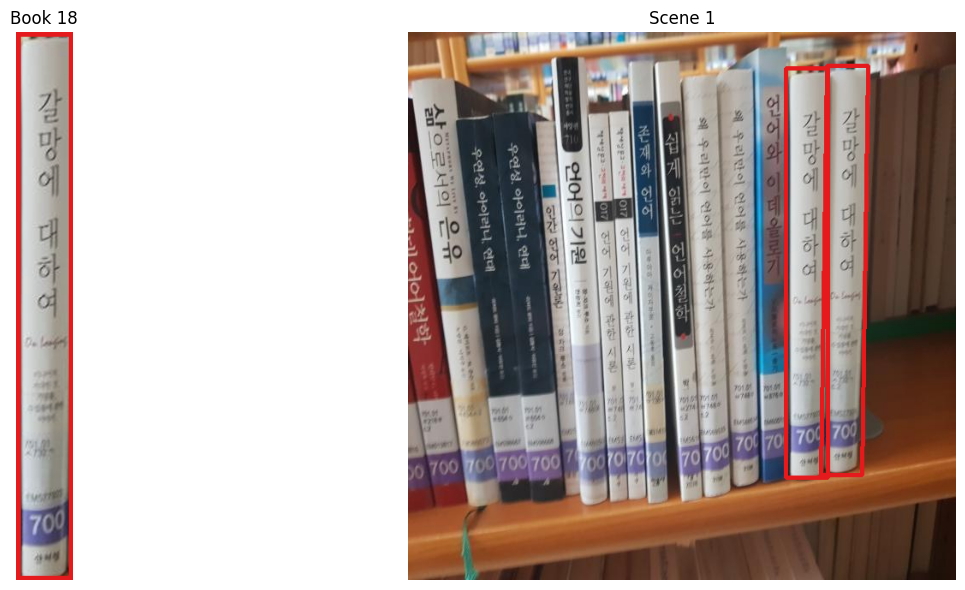



====== DETECTING FOR SCENE scene_2.jpg ======
Book 17 - 1 instance(s) found:
	Instance 1 {top_left: (283, 25), top_right: (318, 25), bottom_left: (283, 503), bottom_right: (318, 503), area: 16364px}


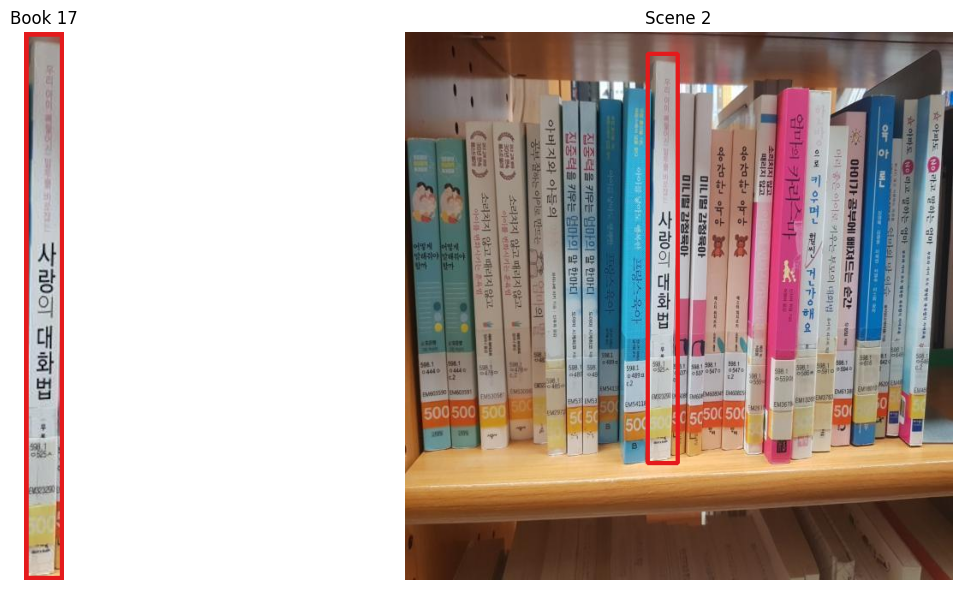



====== DETECTING FOR SCENE scene_3.jpg ======
Book 16 - 2 instance(s) found:
	Instance 1 {top_left: (377, 209), top_right: (425, 209), bottom_left: (377, 542), bottom_right: (425, 542), area: 16049px}
	Instance 2 {top_left: (425, 208), top_right: (474, 209), bottom_left: (417, 549), bottom_right: (466, 551), area: 16701px}


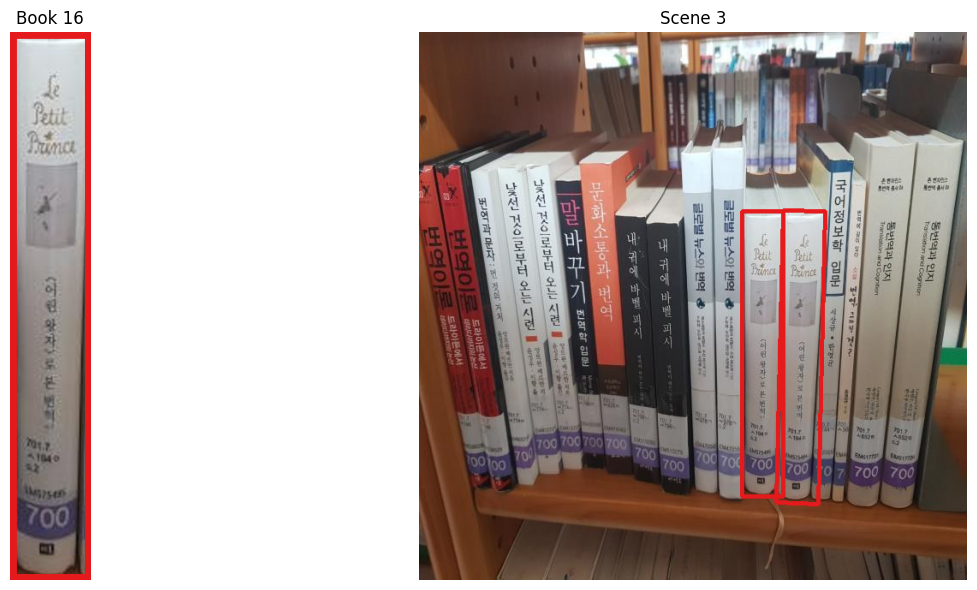



====== DETECTING FOR SCENE scene_4.jpg ======
Book 14 - 2 instance(s) found:
	Instance 1 {top_left: (92, 1), top_right: (135, 1), bottom_left: (92, 617), bottom_right: (135, 617), area: 26515px}
	Instance 2 {top_left: (55, -3), top_right: (98, -4), bottom_left: (59, 620), bottom_right: (102, 620), area: 26789px}
Book 15 - 2 instance(s) found:
	Instance 1 {top_left: (226, 48), top_right: (267, 48), bottom_left: (226, 608), bottom_right: (267, 608), area: 22980px}
	Instance 2 {top_left: (191, 43), top_right: (234, 43), bottom_left: (196, 608), bottom_right: (239, 608), area: 23898px}


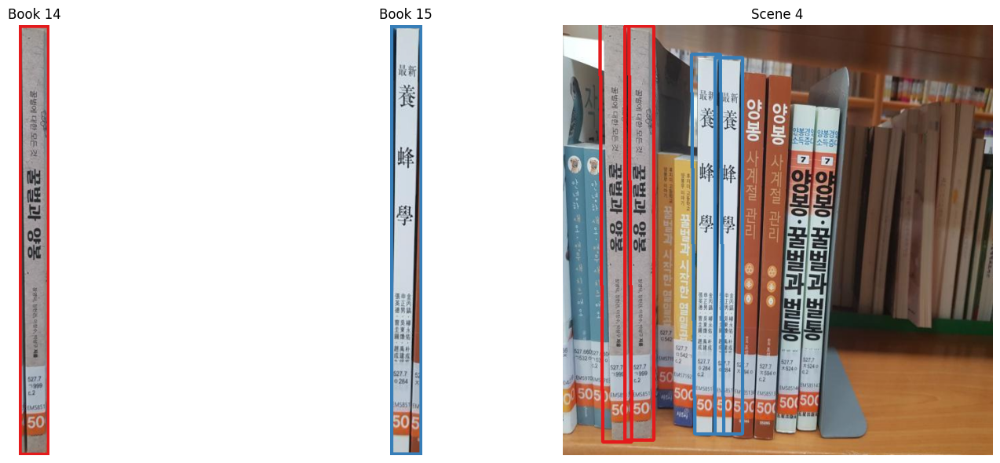



====== DETECTING FOR SCENE scene_5.jpg ======
Book 13 - 1 instance(s) found:
	Instance 1 {top_left: (102, 69), top_right: (145, 69), bottom_left: (102, 572), bottom_right: (145, 572), area: 21636px}


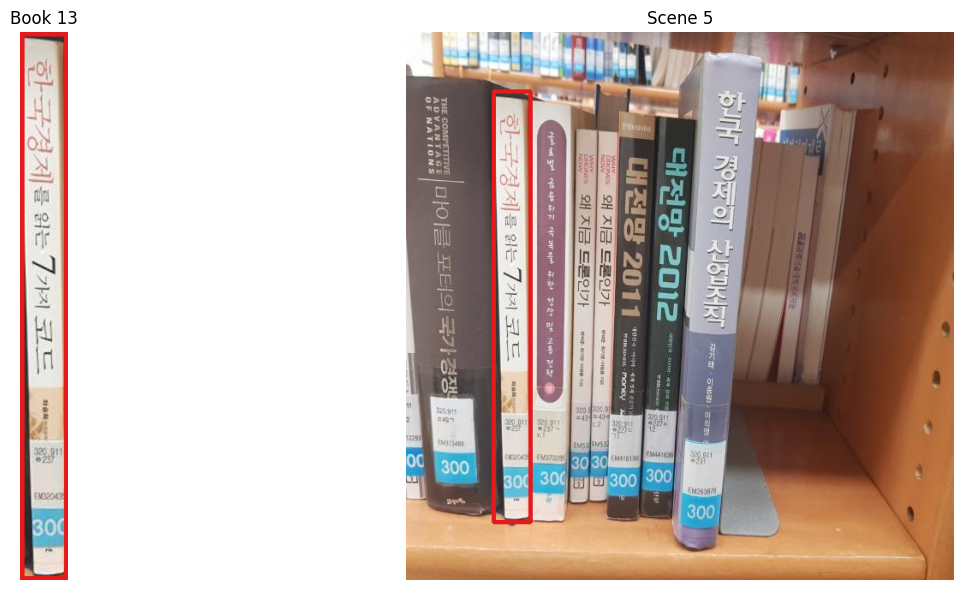



====== DETECTING FOR SCENE scene_6.jpg ======
Book 21 - 1 instance(s) found:
	Instance 1 {top_left: (217, 73), top_right: (270, 73), bottom_left: (217, 563), bottom_right: (270, 563), area: 26170px}


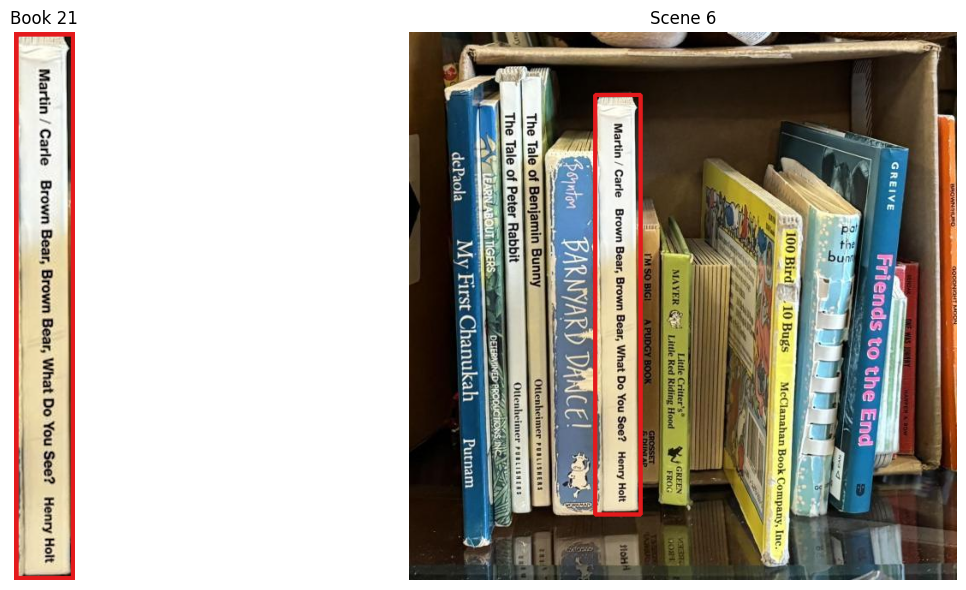



====== DETECTING FOR SCENE scene_7.jpg ======
Book 20 - 2 instance(s) found:
	Instance 1 {top_left: (236, 172), top_right: (289, 172), bottom_left: (236, 555), bottom_right: (289, 555), area: 20451px}
	Instance 2 {top_left: (279, 169), top_right: (335, 170), bottom_left: (274, 562), bottom_right: (330, 563), area: 21793px}


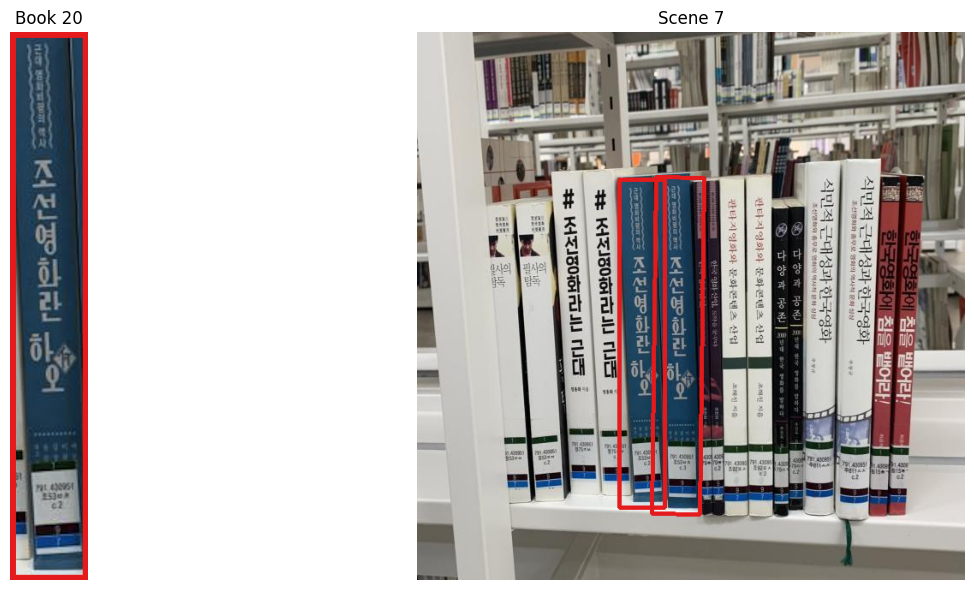



====== DETECTING FOR SCENE scene_8.jpg ======
No instances detected.


====== DETECTING FOR SCENE scene_9.jpg ======
Book 19 - 4 instance(s) found:
	Instance 1 {top_left: (137, 338), top_right: (438, 328), bottom_left: (138, 366), bottom_right: (439, 356), area: 8440px}
	Instance 2 {top_left: (134, 312), top_right: (438, 303), bottom_left: (135, 339), bottom_right: (439, 331), area: 8352px}
	Instance 3 {top_left: (128, 367), top_right: (443, 356), bottom_left: (128, 393), bottom_right: (444, 382), area: 8216px}
	Instance 4 {top_left: (131, 393), top_right: (448, 381), bottom_left: (132, 420), bottom_right: (449, 408), area: 8702px}


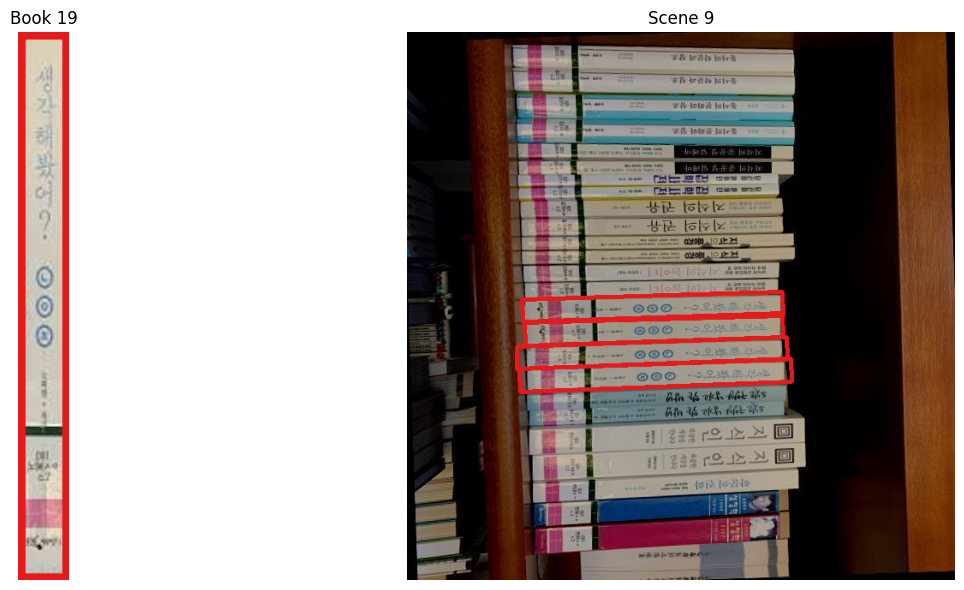



====== DETECTING FOR SCENE scene_10.jpg ======
Book 19 - 4 instance(s) found:
	Instance 1 {top_left: (332, 203), top_right: (359, 203), bottom_left: (332, 503), bottom_right: (359, 503), area: 8277px}
	Instance 2 {top_left: (307, 201), top_right: (335, 201), bottom_left: (305, 505), bottom_right: (332, 505), area: 8289px}
	Instance 3 {top_left: (360, 198), top_right: (385, 198), bottom_left: (360, 518), bottom_right: (385, 518), area: 7936px}
	Instance 4 {top_left: (386, 198), top_right: (412, 198), bottom_left: (386, 508), bottom_right: (412, 508), area: 7978px}


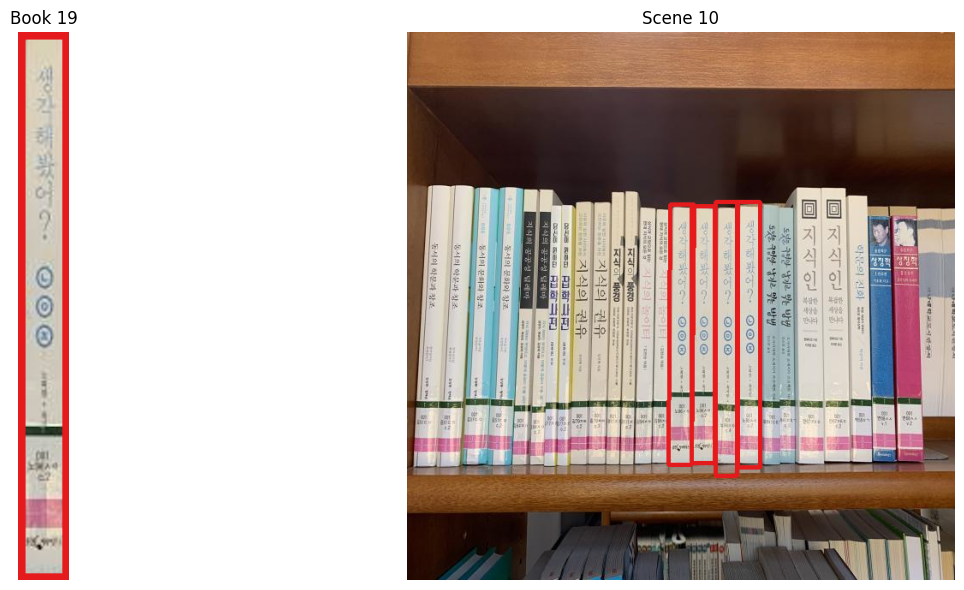



====== DETECTING FOR SCENE scene_11.jpg ======
No instances detected.


====== DETECTING FOR SCENE scene_12.jpg ======
No instances detected.


====== DETECTING FOR SCENE scene_13.jpg ======
No instances detected.


====== DETECTING FOR SCENE scene_14.jpg ======
No instances detected.


====== DETECTING FOR SCENE scene_15.jpg ======
Book 11 - 2 instance(s) found:
	Instance 1 {top_left: (257, 186), top_right: (298, 187), bottom_left: (251, 534), bottom_right: (292, 535), area: 14061px}
	Instance 2 {top_left: (218, 179), top_right: (260, 180), bottom_left: (212, 529), bottom_right: (254, 529), area: 14693px}
Book 12 - 3 instance(s) found:
	Instance 1 {top_left: (499, 214), top_right: (529, 215), bottom_left: (494, 527), bottom_right: (524, 527), area: 9320px}
	Instance 2 {top_left: (473, 212), top_right: (504, 212), bottom_left: (468, 532), bottom_right: (499, 532), area: 10063px}
	Instance 3 {top_left: (524, 213), top_right: (554, 214), bottom_left: (517, 534), bottom_right: (547, 534

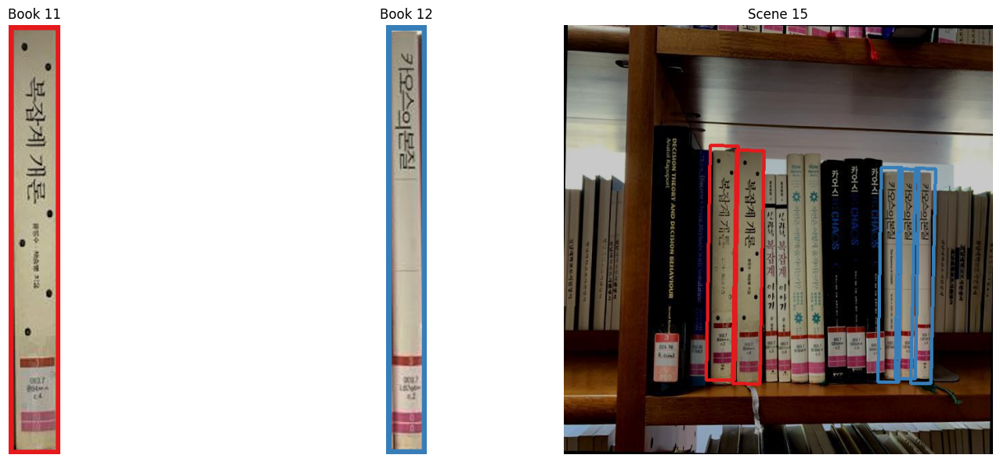



====== DETECTING FOR SCENE scene_16.jpg ======
Book 11 - 2 instance(s) found:
	Instance 1 {top_left: (257, 186), top_right: (298, 187), bottom_left: (251, 534), bottom_right: (292, 535), area: 14177px}
	Instance 2 {top_left: (218, 179), top_right: (260, 180), bottom_left: (211, 525), bottom_right: (253, 526), area: 14584px}
Book 12 - 3 instance(s) found:
	Instance 1 {top_left: (500, 214), top_right: (529, 214), bottom_left: (494, 527), bottom_right: (523, 527), area: 9141px}
	Instance 2 {top_left: (524, 214), top_right: (554, 214), bottom_left: (519, 527), bottom_right: (548, 528), area: 9185px}
	Instance 3 {top_left: (472, 212), top_right: (504, 212), bottom_left: (467, 536), bottom_right: (499, 537), area: 10359px}


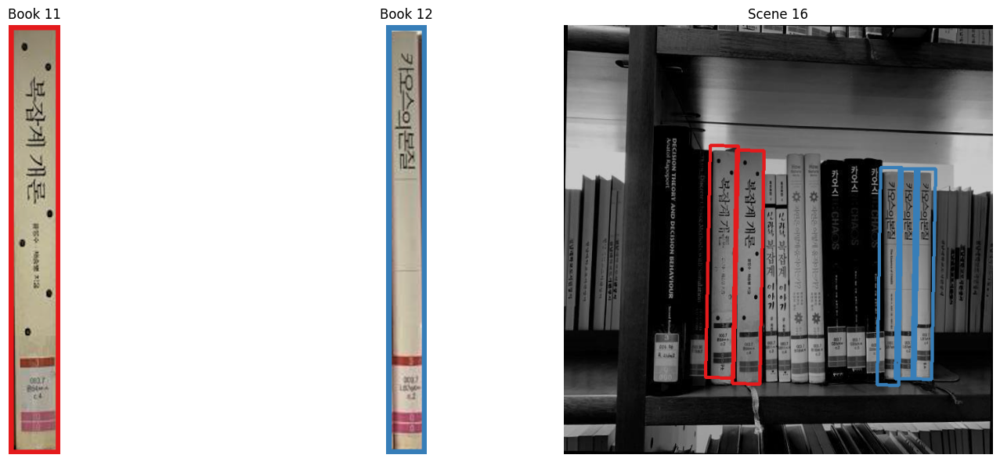



====== DETECTING FOR SCENE scene_17.jpg ======
Book 11 - 2 instance(s) found:
	Instance 1 {top_left: (254, 187), top_right: (295, 187), bottom_left: (254, 535), bottom_right: (295, 535), area: 14207px}
	Instance 2 {top_left: (215, 184), top_right: (257, 184), bottom_left: (216, 520), bottom_right: (258, 519), area: 14199px}
Book 12 - 3 instance(s) found:
	Instance 1 {top_left: (497, 210), top_right: (526, 211), bottom_left: (497, 523), bottom_right: (526, 523), area: 9143px}
	Instance 2 {top_left: (522, 208), top_right: (551, 208), bottom_left: (521, 509), bottom_right: (550, 509), area: 8822px}
	Instance 3 {top_left: (469, 209), top_right: (502, 209), bottom_left: (470, 525), bottom_right: (503, 525), area: 10396px}


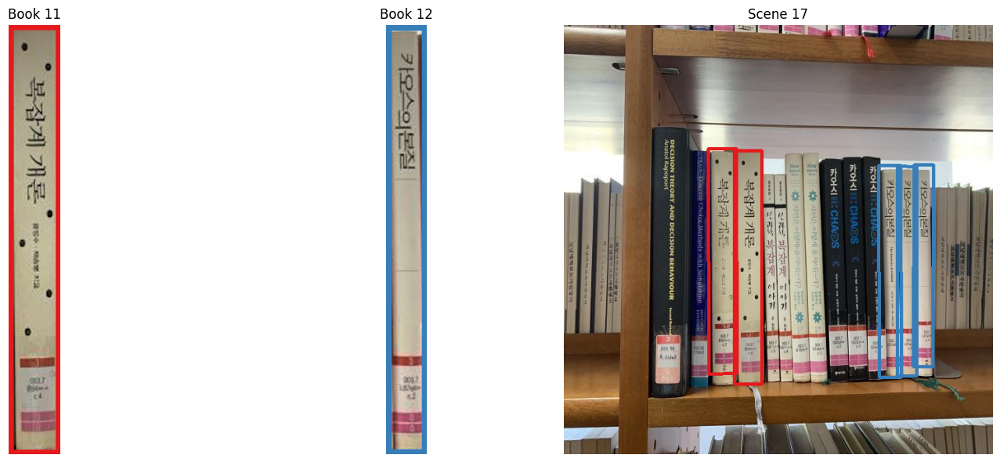



====== DETECTING FOR SCENE scene_18.jpg ======
Book 8 - 3 instance(s) found:
	Instance 1 {top_left: (291, 131), top_right: (318, 131), bottom_left: (291, 586), bottom_right: (318, 586), area: 12301px}
	Instance 2 {top_left: (314, 133), top_right: (341, 133), bottom_left: (317, 588), bottom_right: (344, 588), area: 12342px}
	Instance 3 {top_left: (266, 128), top_right: (293, 128), bottom_left: (264, 585), bottom_right: (291, 585), area: 12526px}
Book 9 - 3 instance(s) found:
	Instance 1 {top_left: (315, 130), top_right: (342, 130), bottom_left: (315, 586), bottom_right: (342, 586), area: 12282px}
	Instance 2 {top_left: (291, 127), top_right: (319, 127), bottom_left: (289, 586), bottom_right: (316, 586), area: 12564px}
	Instance 3 {top_left: (266, 124), top_right: (294, 124), bottom_left: (262, 583), bottom_right: (290, 583), area: 12853px}
Book 10 - 3 instance(s) found:
	Instance 1 {top_left: (108, 38), top_right: (135, 38), bottom_left: (108, 584), bottom_right: (135, 584), area: 146

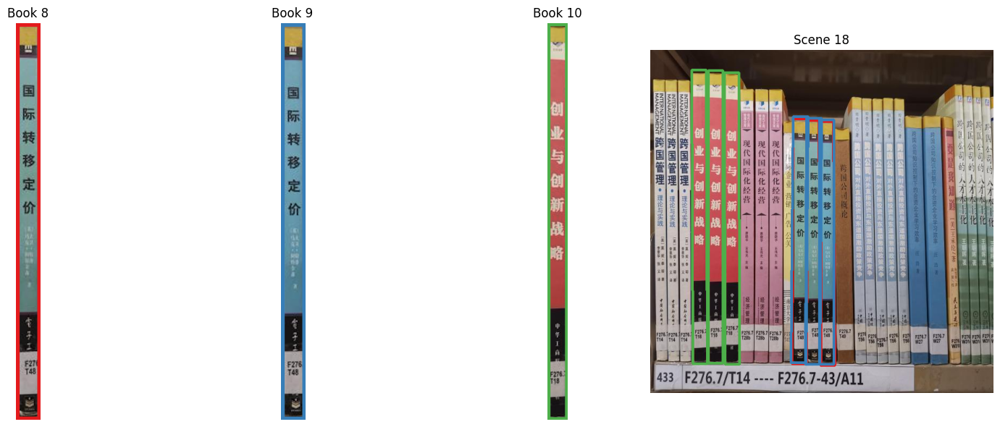



====== DETECTING FOR SCENE scene_19.jpg ======
Book 6 - 3 instance(s) found:
	Instance 1 {top_left: (385, 32), top_right: (411, 32), bottom_left: (385, 579), bottom_right: (411, 579), area: 14230px}
	Instance 2 {top_left: (411, 27), top_right: (437, 28), bottom_left: (409, 579), bottom_right: (435, 579), area: 14333px}
	Instance 3 {top_left: (438, 24), top_right: (464, 24), bottom_left: (438, 582), bottom_right: (464, 582), area: 14626px}
Book 7 - 2 instance(s) found:
	Instance 1 {top_left: (497, 40), top_right: (533, 40), bottom_left: (497, 587), bottom_right: (533, 587), area: 19814px}
	Instance 2 {top_left: (458, 42), top_right: (494, 42), bottom_left: (459, 584), bottom_right: (495, 584), area: 19666px}


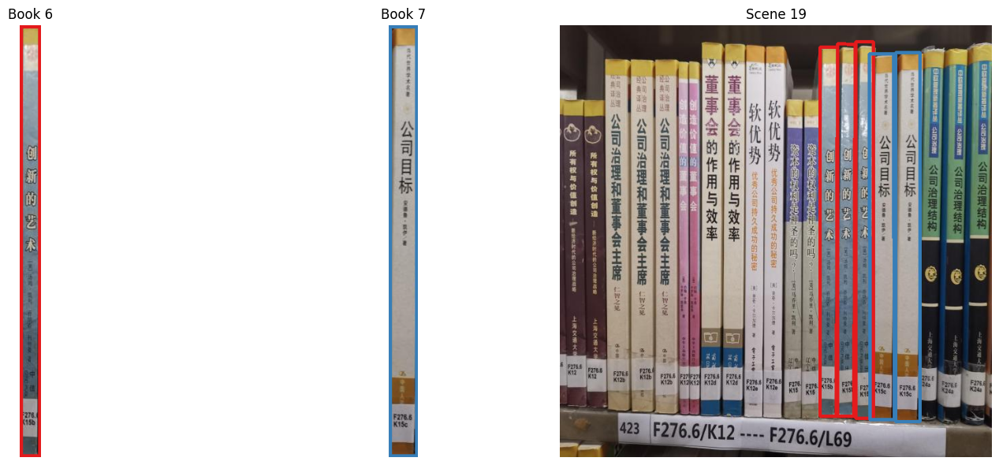



====== DETECTING FOR SCENE scene_20.jpg ======
No instances detected.


====== DETECTING FOR SCENE scene_21.jpg ======
No instances detected.


====== DETECTING FOR SCENE scene_22.jpg ======
No instances detected.


====== DETECTING FOR SCENE scene_23.jpg ======
Book 5 - 1 instance(s) found:
	Instance 1 {top_left: (342, 149), top_right: (391, 149), bottom_left: (342, 571), bottom_right: (391, 571), area: 20625px}


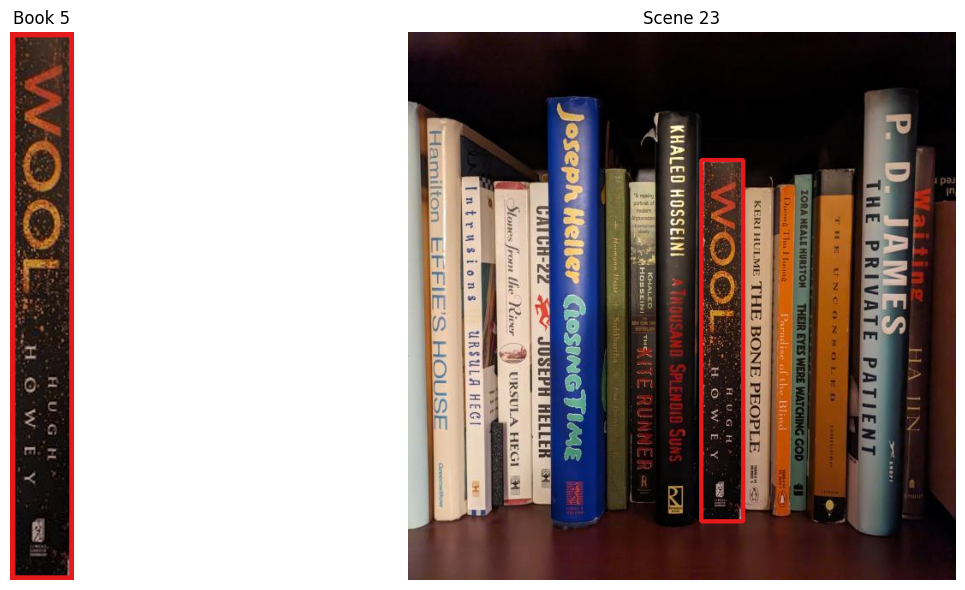



====== DETECTING FOR SCENE scene_24.jpg ======
No instances detected.


====== DETECTING FOR SCENE scene_25.jpg ======
No instances detected.


====== DETECTING FOR SCENE scene_26.jpg ======
Book 0 - 2 instance(s) found:
	Instance 1 {top_left: (210, 180), top_right: (243, 180), bottom_left: (210, 567), bottom_right: (243, 567), area: 13024px}
	Instance 2 {top_left: (169, 181), top_right: (204, 181), bottom_left: (175, 571), bottom_right: (209, 570), area: 13401px}
Book 4 - 1 instance(s) found:
	Instance 1 {top_left: (248, 183), top_right: (432, 183), bottom_left: (248, 526), bottom_right: (432, 526), area: 63080px}


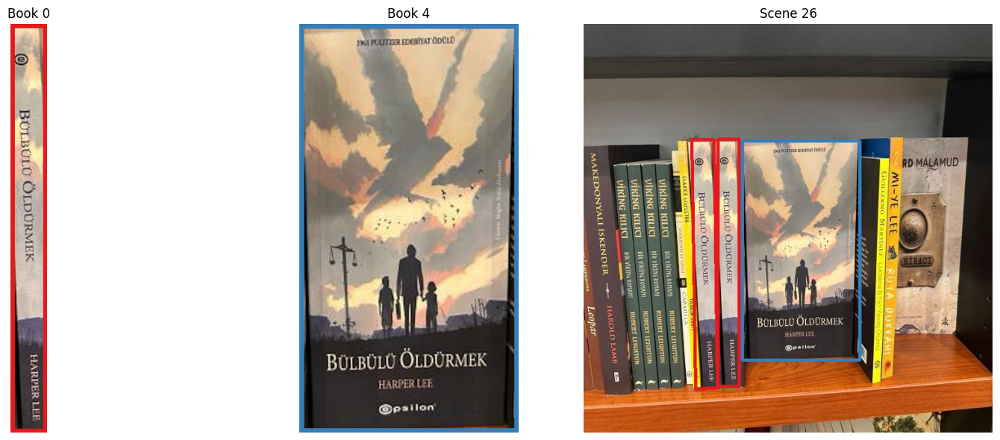



====== DETECTING FOR SCENE scene_27.jpg ======
Book 2 - 2 instance(s) found:
	Instance 1 {top_left: (257, 146), top_right: (302, 146), bottom_left: (257, 563), bottom_right: (302, 563), area: 18638px}
	Instance 2 {top_left: (308, 121), top_right: (366, 122), bottom_left: (295, 585), bottom_right: (353, 587), area: 27087px}
Book 3 - 2 instance(s) found:
	Instance 1 {top_left: (416, 141), top_right: (466, 142), bottom_left: (400, 566), bottom_right: (450, 568), area: 21206px}
	Instance 2 {top_left: (361, 98), top_right: (423, 100), bottom_left: (348, 585), bottom_right: (409, 587), area: 30045px}


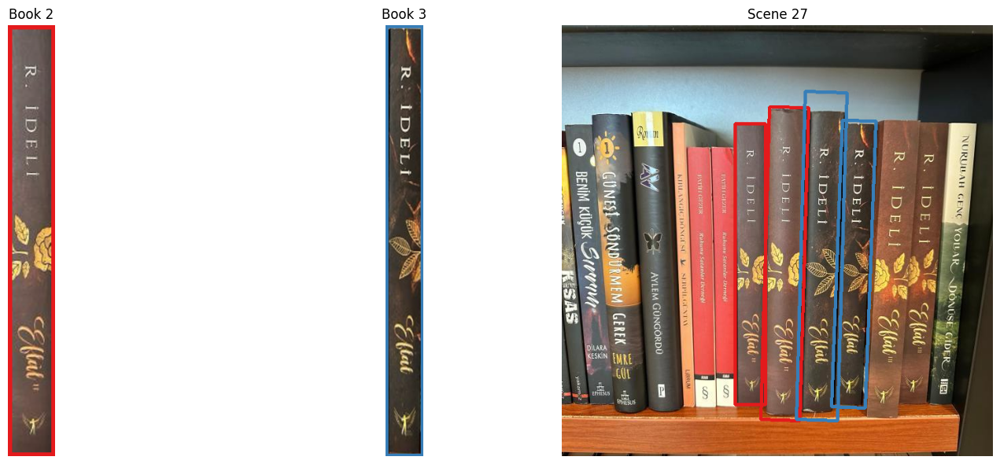



====== DETECTING FOR SCENE scene_28.jpg ======
Book 1 - 2 instance(s) found:
	Instance 1 {top_left: (207, 247), top_right: (235, 247), bottom_left: (206, 554), bottom_right: (235, 554), area: 8726px}
	Instance 2 {top_left: (235, 240), top_right: (265, 240), bottom_left: (235, 553), bottom_right: (265, 553), area: 9398px}


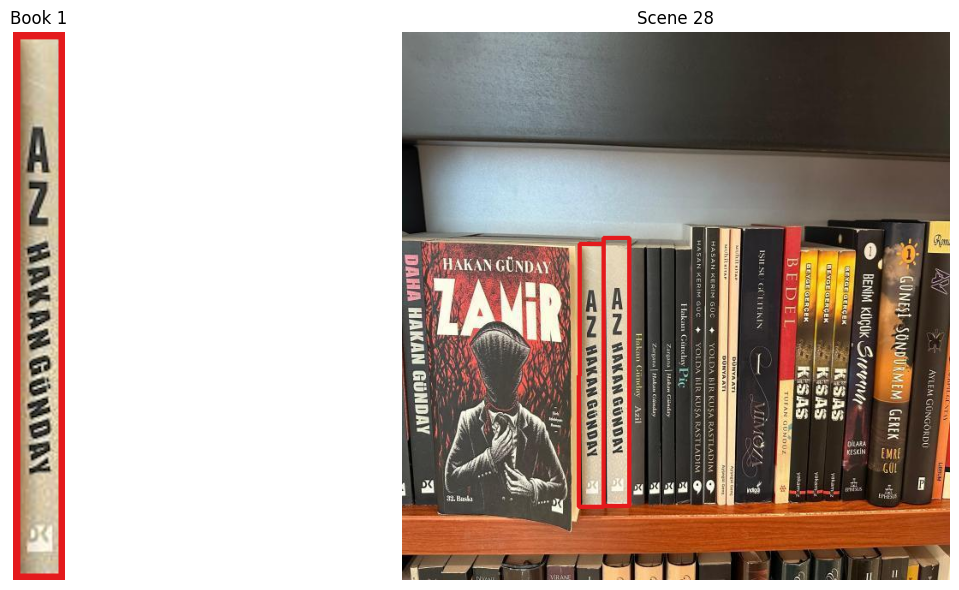

In [11]:
# Set both to True for debug's statistics and visualizations
VERBOSE = False
VISUALIZE_MASKS = False

# Set upper limit of max iterations
MAX_ITERATIONS = 5


# Create detector
detector = MultiInstanceBookDetector(
    sift=sift,
    min_match_count=52,
    matching_method='bf',
    lowe_ratio=.7,
    ransac_reproj_threshold=4.,
    min_inlier_ratio=.41,
    min_length_ratio=.8,
    max_length_ratio=1.16,
    max_area_ratio=.05,
    verbose=VERBOSE
)

# Run multi-instance detection for each scene
for scene in scene_images:
    scene_name = scene[1]
    print(f"\n\n====== DETECTING FOR SCENE {scene_name} ======")
    detections = []

    for model in model_images:
        model_name = model[1]
        result = detector.detect_multiple_instances(
            model_descriptors=models_sift[model_name],
            scene_descriptors=scenes_sift[scene_name],
            model=model,
            scene=scene,
            max_iterations=MAX_ITERATIONS,
            visualize_masks=VISUALIZE_MASKS
        )

        if result and result.instances:
            detections.append(result)
            print(result.serialize_model())

    if detections:
        visualize_scene_with_models(scene, detections)
    else:
        print("No instances detected.")

## Final considerations


While the proposed pipeline demonstrates strong performance across the provided dataset, several limitations should be acknowledged. First, the overall processing time remains relatively high, primarily due to the cost of dense SIFT extraction combined with the repeated use of a brute-force matcher, which guarantees exact nearest-neighbor retrieval but at a significant computational expense. Second, the method is inherently sensitive to hyperparameter tuning: in addition to SIFT parameters, thresholds such as inlier ratio, length ratios or good matches must be carefully tuned, as inappropriate values can either suppress valid detections or introduce geometric inconsistencies. 

Additionally, although the corner-rectification step stabilizes most bounding boxes, the resulting geometry may still be imperfect in cases of insufficient numbers of reliable matches. 

Despite these limitations, the developed pipeline reliably detects all book instances in the assignment dataset.